In [6]:
#@title Install requirements
from io import BytesIO
import IPython
import json
import os
from PIL import Image
import requests
import time
from google.colab import output

In [3]:
#@title Connect to the Stability API

import getpass
# @markdown To get your API key visit https://platform.stability.ai/account/keys
STABILITY_KEY = getpass.getpass('Enter your API Key')



Enter your API Key··········


In [4]:
#@title Define functions

def send_async_generation_request(
    host,
    params,
):
    headers = {
        "Accept": "application/json",
        "Authorization": f"Bearer {STABILITY_KEY}"
    }

    # Encode parameters
    files = {}
    if "init_image" in params:
        init_image = params.pop("init_image")
        files = {"image": open(init_image, 'rb')}

    # Send request
    print(f"Sending REST request to {host}...")
    response = requests.post(
        host,
        headers=headers,
        files=files,
        data=params
    )
    if not response.ok:
        raise Exception(f"HTTP {response.status_code}: {response.text}")

    # Process async response
    response_dict = json.loads(response.text)
    generation_id = response_dict.get("id", None)
    assert generation_id is not None, "Expected id in response"

    # Loop until result or timeout
    timeout = int(os.getenv("WORKER_TIMEOUT", 500))
    start = time.time()
    status_code = 202
    while status_code == 202:
        response = requests.get(
            f"{host}/result/{generation_id}",
            headers={
                **headers,
                "Accept": "image/*"
            },
        )

        if not response.ok:
            raise Exception(f"HTTP {response.status_code}: {response.text}")
        status_code = response.status_code
        time.sleep(10)
        if time.time() - start > timeout:
            raise Exception(f"Timeout after {timeout} seconds")

    return response

# Generation

Stable Image services include one offering currently in production:

Core: The best standard text to image generation service
See https://platform.stability.ai/docs/api-reference#tag/Generate

Try these services out in the sections below. Check back in for regular updates.

Feedback welcome.

Sending REST request to https://api.stability.ai/v2beta/stable-image/upscale/creative...
Saved image upscaled_bird_1465879083.webp


<IPython.core.display.Javascript object>

Original image:


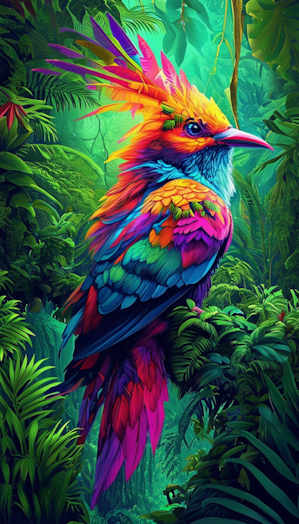

Result image:


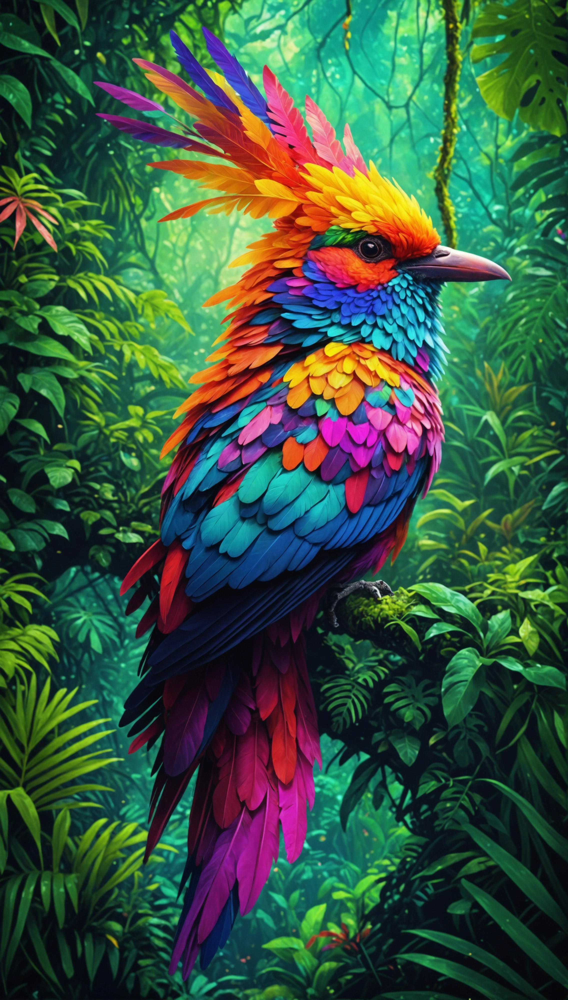

In [8]:
#@title Creative Upscaler

#@markdown - Drag and drop image to file folder on left
#@markdown - Right click it and choose Copy path
#@markdown - Paste that path into init_image field below
#@markdown <br><br>

init_image = "/content/bird.png" #@param {type:"string"}
prompt = "This dreamlike digital art captures a vibrant, kaleidoscopic bird in a lush rainforest" #@param {type:"string"}
negative_prompt = "" #@param {type:"string"}
seed = 0 #@param {type:"integer"}
creativity = 0.3 #@param {type:"number"}
output_format = "webp" #@param ["webp", "jpeg", "png"]

host = f"https://api.stability.ai/v2beta/stable-image/upscale/creative"

params = {
    "prompt" : prompt,
    "negative_prompt" : negative_prompt,
    "seed" : seed,
    "creativity" : creativity,
    "init_image" : init_image,
    "output_format": output_format
}

response = send_async_generation_request(
    host,
    params
)

# Decode response
output_image = response.content
finish_reason = response.headers.get("finish-reason")
seed = response.headers.get("seed")

# Check for NSFW classification
if finish_reason == 'CONTENT_FILTERED':
    raise Warning("Generation failed NSFW classifier")

# Save and display result
filename, _ = os.path.splitext(os.path.basename(init_image))
upscaled = f"upscaled_{filename}_{seed}.{output_format}"
with open(upscaled, "wb") as f:
    f.write(output_image)
print(f"Saved image {upscaled}")

output.no_vertical_scroll()
print("Original image:")
IPython.display.display(Image.open(init_image))
print("Result image:")
IPython.display.display(Image.open(upscaled))